# Model1 - RNN model of CPRO task using PyTorch

#### Taku Ito
#### 09/30/2018

In [2]:
import torch
from torch.autograd import Variable
import torch.nn.functional as F
import numpy as np
np.set_printoptions(suppress=True)
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
%matplotlib inline
import os
import model.model4 as model
model = reload(model)
import model.task as task
task = reload(task)
import time

retrain = True
modeldir = '../../models/Model3c/'

# Train RNN first on a subset of tasks (half the tasks) using GPU

In [349]:

model = reload(model)
NetModel = model.RNN(NUM_RULE_INPUTS=12,
                     NUM_SENSORY_INPUTS=16,
                     NUM_HIDDEN=256,
                     NUM_MOTOR_DECISION_OUTPUTS=4)
NetModel.cuda()
NetModel.loadTrainingBatch(cuda=True)


RuntimeError: CUDA out of memory. Tried to allocate 343.38 MiB (GPU 0; 4.63 GiB total capacity; 4.27 GiB already allocated; 35.25 MiB free; 3.15 MiB cached)

In [348]:
timestart = time.time()
NetModel.runTrainingEpoch(cuda=True)  
timeend = time.time()
print 'Time elapsed using GPU:', timeend-timestart

Iteration: 0
	loss: 0.249645680189
	Accuracy: 32.5%
Iteration: 5000
	loss: 0.16952867806
	Accuracy: 45.625%
Iteration: 10000
	loss: 0.135051384568
	Accuracy: 50.0%
Iteration: 15000
	loss: 0.106414437294
	Accuracy: 58.125%
Iteration: 20000
	loss: 0.0562683641911
	Accuracy: 90.625%
Iteration: 25000
	loss: 0.0561847090721
	Accuracy: 78.125%
Iteration: 30000
	loss: 0.0283935554326
	Accuracy: 88.75%
Iteration: 35000
	loss: 0.0111156655475
	Accuracy: 95.625%
Iteration: 40000
	loss: 0.0687869563699
	Accuracy: 72.5%
Iteration: 45000
	loss: 0.0734596997499
	Accuracy: 70.625%
Iteration: 50000
	loss: 0.103226996958
	Accuracy: 58.75%
Iteration: 55000
	loss: 0.0378596261144
	Accuracy: 85.0%
Iteration: 60000
	loss: 0.0813627392054
	Accuracy: 67.5%
Iteration: 65000
	loss: 0.0781350582838
	Accuracy: 68.75%
Iteration: 70000
	loss: 0.0266642663628
	Accuracy: 89.375%
Iteration: 75000
	loss: 0.0657007023692
	Accuracy: 73.75%
Iteration: 80000
	loss: 0.061524104327
	Accuracy: 75.625%
Iteration: 85000
	loss:

# Train RNN first on a subset of tasks (half the tasks) using CPU

In [4]:

model = reload(model)
NetModel = model.RNN(NUM_RULE_INPUTS=12,
                     NUM_SENSORY_INPUTS=16,
                     NUM_HIDDEN=128,
                     NUM_MOTOR_DECISION_OUTPUTS=4)
NetModel.cpu()
NetModel.loadTrainingBatch(cuda=False)


In [5]:
timestart = time.time()
NetModel.runTrainingEpoch(cuda=False)  
timeend = time.time()
print 'Time elapsed using CPU:', timeend-timestart

torch.Size([160, 4])
torch.Size([160, 4])
tensor(0.2488, grad_fn=<MseLossBackward>)
Iteration: 0
	loss: 0.248819708824
	Accuracy: 23.75%
torch.Size([160, 4])
torch.Size([160, 4])
tensor(0.2477, grad_fn=<MseLossBackward>)
torch.Size([160, 4])
torch.Size([160, 4])
tensor(0.2469, grad_fn=<MseLossBackward>)
torch.Size([160, 4])
torch.Size([160, 4])
tensor(0.2463, grad_fn=<MseLossBackward>)
torch.Size([160, 4])
torch.Size([160, 4])
tensor(0.2444, grad_fn=<MseLossBackward>)
torch.Size([160, 4])
torch.Size([160, 4])
tensor(0.2437, grad_fn=<MseLossBackward>)
torch.Size([160, 4])
torch.Size([160, 4])
tensor(0.2446, grad_fn=<MseLossBackward>)
torch.Size([160, 4])
torch.Size([160, 4])
tensor(0.2425, grad_fn=<MseLossBackward>)
torch.Size([160, 4])
torch.Size([160, 4])
tensor(0.2422, grad_fn=<MseLossBackward>)
torch.Size([160, 4])
torch.Size([160, 4])
tensor(0.2389, grad_fn=<MseLossBackward>)
torch.Size([160, 4])
torch.Size([160, 4])
tensor(0.2441, grad_fn=<MseLossBackward>)
torch.Size([160, 4])
to

# Test on held-out tasks

In [449]:
NetModel.evaluateTestset(cuda=False)

	Accuracy: 60.75%


___

## Run random simulation to get FC weights

In [308]:
previous_r = Variable(torch.Tensor(1, NUM_HIDDEN).zero_(), requires_grad=False)
error = 0


activity = []
acc = []
for timestep in range(1000):
    inputs = np.random.normal(0,0.5,(NUM_HIDDEN,))
    
    u = Variable(torch.Tensor([inputs]))
    target = Variable(torch.Tensor([outputs[timestep]]))

    # The neural network
    r = previous_r - drdt*previous_r + drdt* F.relu(previous_r.mm(w_rec) + u.mm(w_rec) + bias)
    activity.append(np.asarray(r.data))
    output = r.mm(w_out)

#    error += torch.mean((output - target).pow(2))  # Mean squared error loss
    previous_r = r  # Recurrence

            
activity = np.squeeze(np.asarray(activity))

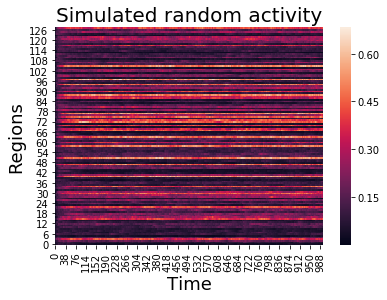

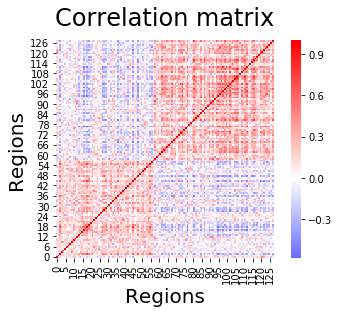

In [313]:
plt.figure()
plt.title('Simulated random activity', fontsize=20)
ax = sns.heatmap(activity.T)
ax.invert_yaxis()
plt.xlabel('Time',fontsize=18)
plt.ylabel('Regions',fontsize=18)

# Construct correlation matrix
corrmat = np.corrcoef(activity.T)
sig = np.multiply(corrmat,corrmat>0)
ci, q = bct.community_louvain(sig)
networkdef = sorted(range(len(ci)), key=lambda k: ci[k])
networkdef = np.asarray(networkdef)
networkdef.shape = (len(networkdef),1)

plt.figure()
ax = sns.heatmap(corrmat[networkdef,networkdef.T],square=True,center=0,cmap='bwr')
ax.invert_yaxis()
plt.title('Correlation matrix',fontsize=24,y=1.04)
plt.xlabel('Regions',fontsize=20)
plt.ylabel('Regions',fontsize=20)
plt.savefig('NoiseInduced_CorrelationMatrix.pdf')

## Analyze recurrent connectivity weights

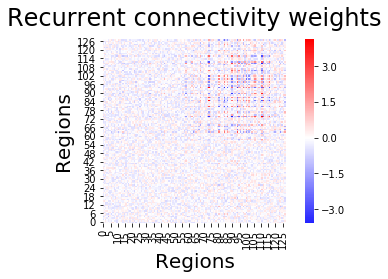

In [314]:
mat = np.asarray(w_rec.data)
plt.figure()
ax = sns.heatmap(mat[networkdef,networkdef.T],square=True,center=0,cmap='bwr')
ax.invert_yaxis()
plt.title('Recurrent connectivity weights',fontsize=24,y=1.04)
plt.xlabel('Regions',fontsize=20)
plt.ylabel('Regions',fontsize=20)
plt.tight_layout()
plt.savefig('GroundTruth_RNN_weights.pdf')

## Do an eigendecomposition on connectivity matrix

In [311]:
eigvalues, eigvec = np.linalg.eig(mat)
ind = sorted(range(len(eigvalues)), key=lambda k: -eigvalues[k])
eigvec = eigvec[ind]
eigvalues = eigvalues[ind]
